# **SPRINT 1**

### **DATA LOADING AND PROCESSING**

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import cv2
import pandas as pd
import ntpath
import random

**Downloading the data**

In [ ]:
!git clone https://github.com/rslim087a/track


Cloning into 'track'...
remote: Enumerating objects: 12163, done.
remote: Total 12163 (delta 0), reused 0 (delta 0), pack-reused 12163 (from 1)
Receiving objects: 100% (12163/12163), 156.98 MiB | 10.84 MiB/s, done.
Updating files: 100% (12160/12160), done.


**Assigning  column headers**

In [ ]:
datadir = 'track'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', None)
data.head()


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


**Extracting the filename from the file path**



In [ ]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


**------>** We notice that the filename center_2018_07_16_17_11_43_382.jpg was extracted from the path C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg to make the data manipulation more simple

**Visualize the distribution of steering angles**

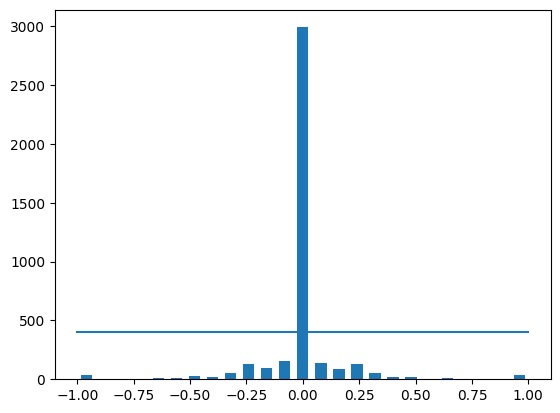

In [ ]:
num_bins = 25
samples_per_bin=400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

**---->** We notice that our dataset has mostly 0.00-degree steering angles because much of the driving was done in a straight line. This creates an imbalance, making the model favor straight driving and struggle with turns.

The dataset has 4053 rows and 7 columns

In [ ]:
print('total data:', len(data))
print(data.shape)

total data: 4053
(4053, 7)


# **SPRINT 2**

### **DATA BALANCING**

In [ ]:
remove_list = []
for j in range(num_bins):
    list_ = []  # Store indices for the current bin
    for i in range(len(data['steering'])):
        if data['steering'][i] >= bins[j] and data['steering'][i] < bins[j+1]:
            list_.append(i)
    list_ = shuffle(list_)
    list_to_remove = list_[samples_per_bin:]
    remove_list.extend(list_to_remove)

print('Removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
data.reset_index(drop=True, inplace=True)
print('Remaining:', len(data))



Removed: 2590
Remaining: 1463


**----->**  This code is about balancing the dataset by removing excess samples from 0.00 degree steering angle bins ensuring that the model doesn't get biased towards it .

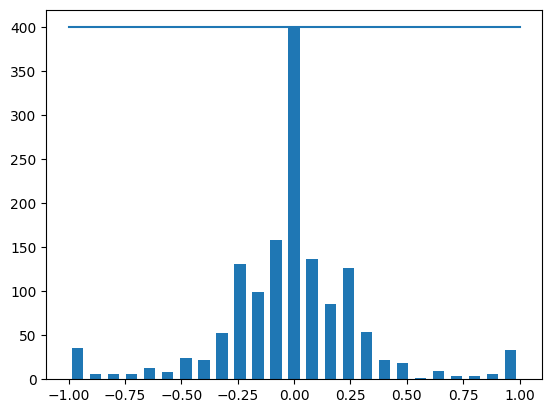

In [ ]:
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

We notice that after removing the zeros the amount of data dropped significantly from 3000 to 400.

# Training and Validation split

This function loads image paths and their corresponding steering angles from the dataset for training the self-driving car model. For each row in the dataset, it uses the center, left, and right camera images—adjusting the steering angle slightly for the left (+0.15) and right (–0.15) images to simulate off-center recovery. It returns arrays of image paths and adjusted steering values to help the model learn better driving behavior.

In [ ]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

In [ ]:
image_paths, steerings = load_img_steering(datadir + '/IMG', data)

<ipython-input-9-ec36c73ac642>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
<ipython-input-9-ec36c73ac642>:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))
<ipython-input-9-ec36c73ac642>:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3])+0.15)
<ipython-input-9-ec36c73ac642>:14: Fut

In [ ]:
image_paths

array(['track/IMG/center_2018_07_16_17_11_44_413.jpg',
       'track/IMG/left_2018_07_16_17_11_44_413.jpg',
       'track/IMG/right_2018_07_16_17_11_44_413.jpg', ...,
       'track/IMG/center_2018_07_16_17_16_30_911.jpg',
       'track/IMG/left_2018_07_16_17_16_30_911.jpg',
       'track/IMG/right_2018_07_16_17_16_30_911.jpg'], dtype='<U44')

In [ ]:
steerings

array([-0.05,  0.1 , -0.2 , ...,  0.  ,  0.15, -0.15])

In [ ]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 3511
Valid Samples: 878


plotting the distribution and validation sets: ( they need to be similar )

Text(0.5, 1.0, 'Validation set')

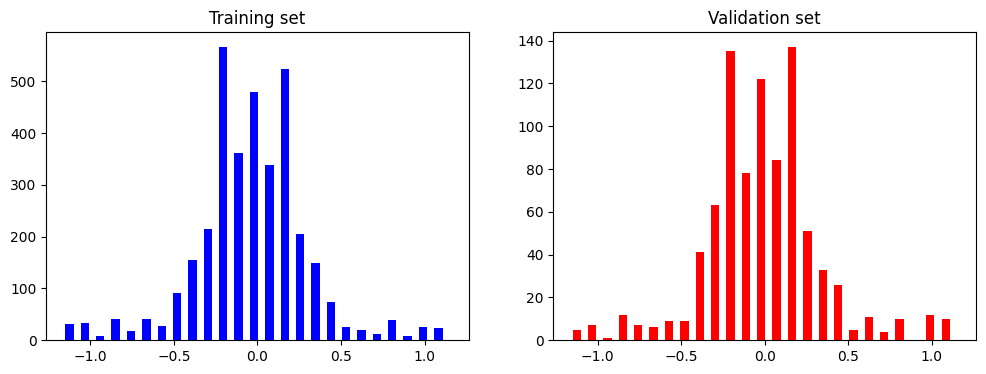

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

NOTE: The training and validation sets should come from the same distribution so that validation results are meaningful and the model learns to perform well on real-world-like, varied scenarios.

# Data Augmentation

In [ ]:
import albumentations as A

The `zoom` function applies a random zoom-in effect to an image using the `albumentations` library. It uses the `RandomScale` transformation to enlarge the image by up to 30%, helping simulate closer views of the road. This type of data augmentation improves model robustness by making it better at recognizing features at different scales, which is especially useful in the training of self-driving car models.

Text(0.5, 1.0, 'Zoomed Image')

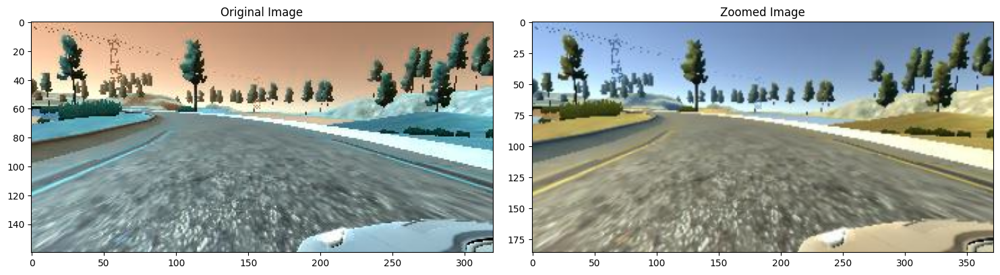

In [ ]:
def zoom(image):
    transform = A.Compose([
        A.RandomScale(scale_limit=(0.0, 0.3), p=1.0)
    ])
    augmented = transform(image=image)
    return augmented["image"]

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
original_image = cv2.cvtColor(original_image, cv2.COLOR_RGB2BGR)  # albumentations uses BGR
zoomed_image = zoom(original_image)
zoomed_image = cv2.cvtColor(zoomed_image, cv2.COLOR_BGR2RGB)      # convert back for display

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

The `pan` function applies a random horizontal and vertical shift (panning) to an image using the `albumentations` library. It uses the `ShiftScaleRotate` transformation with a shift limit of 10%, meaning the image can move slightly left, right, up, or down. This helps the model become more robust by simulating small changes in the vehicle’s viewpoint, making it better at recognizing features even when the camera position slightly varies.

/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:111: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


Text(0.5, 1.0, 'Panned Image')

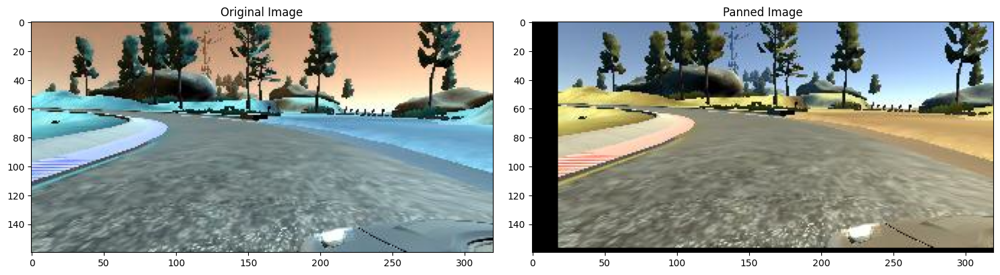

In [ ]:
def pan(image):
    transform = A.Compose([
        A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0, rotate_limit=0, p=1.0)
    ])
    augmented = transform(image=image)
    return augmented["image"]

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
original_image = cv2.cvtColor(original_image, cv2.COLOR_RGB2BGR)  # Convert to BGR for albumentations

panned_image = pan(original_image)
panned_image = cv2.cvtColor(panned_image, cv2.COLOR_BGR2RGB)      # Convert back for display

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

The `RandomBrightnessContrast` transformation adjusts the **brightness** and **contrast** of the image. By setting `brightness_limit=0.5`, the brightness is randomly changed within ±50% of its original value, and `contrast_limit=0` ensures no contrast change. This is helpful for simulating varying lighting conditions, making the model more robust.

Text(0.5, 1.0, 'Brightness Altered Image')

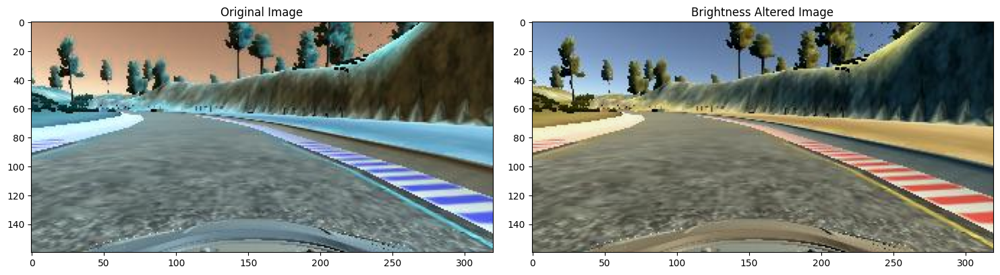

In [ ]:
def img_random_brightness(image):
    transform = A.Compose([
        A.RandomBrightnessContrast(brightness_limit=0.5, contrast_limit=0, p=1.0)  # Adjusts brightness by ±50%
    ])
    augmented = transform(image=image)
    return augmented["image"]

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
original_image = cv2.cvtColor(original_image, cv2.COLOR_RGB2BGR)

brightness_altered_image = img_random_brightness(original_image)
brightness_altered_image = cv2.cvtColor(brightness_altered_image, cv2.COLOR_BGR2RGB)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness Altered Image')

The `img_random_flip` function flips an image horizontally and inverts the steering angle to match the flipped perspective, which simulates driving from the opposite side of the car. This augmentation helps the model generalize better by providing it with varied viewpoints of the same scene, improving its ability to recognize road features regardless of the car's orientation. The function displays both the original and flipped images with their respective steering angles.

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.4237503')

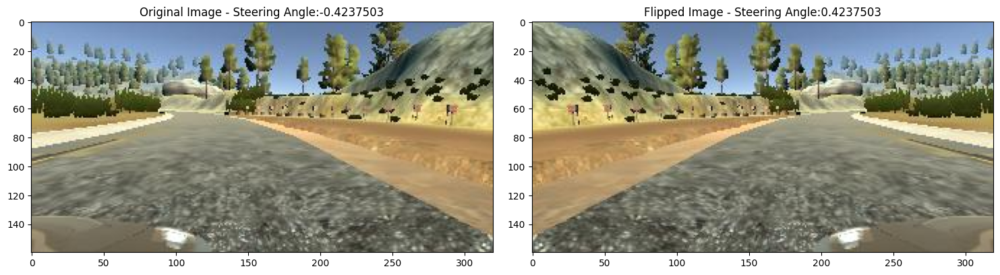

In [ ]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle

random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

The `random_augment` function applies a series of random augmentations to an image and its corresponding steering angle. It randomly chooses whether to apply panning, zooming, brightness adjustment, or flipping, each with a 50% probability. This helps generate diverse training data by simulating various driving conditions, such as different camera angles, lighting, and perspectives, which can improve the model's robustness and generalization capabilities.

In [ ]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

this part of code shows off the difference between the original and augmented image

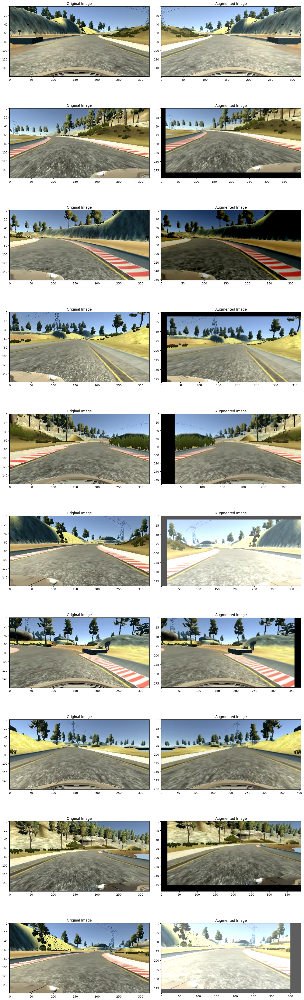

In [ ]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

# **SPRINT 3**

# IMAGE PREPROCESSING

In [ ]:
def img_preprocess(img):
  img=img[60:135,:,:]
  img=cv2.cvtColor(img,cv2.COLOR_RGB2YUV)
  img=cv2.GaussianBlur(img,(3,3),0)
  img=cv2.resize(img,(200,66))
  img=img/255
  return img

Text(0.5, 1.0, 'Preprocessed Image')

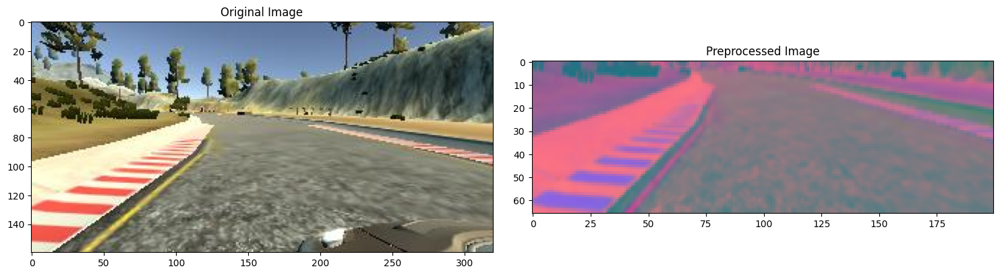

In [ ]:
image=image_paths[100]
original_image=mpimg.imread(image)
preprocessed_image=img_preprocess(original_image)
preprocessed_image= img_preprocess(original_image)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

# BATCH GENERATOR

 The purpose of this batch_generator function is to continuously generate batches of training or validation data for a machine learning model, particularly in image-based regression tasks such as predicting a steering angle from a camera image

In [ ]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):
  while True:
    batch_img = []
    batch_steering = []
    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)
      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]
      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
      yield (np.asarray(batch_img), np.asarray(batch_steering))


In [ ]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))


Text(0.5, 1.0, 'Validation Image')

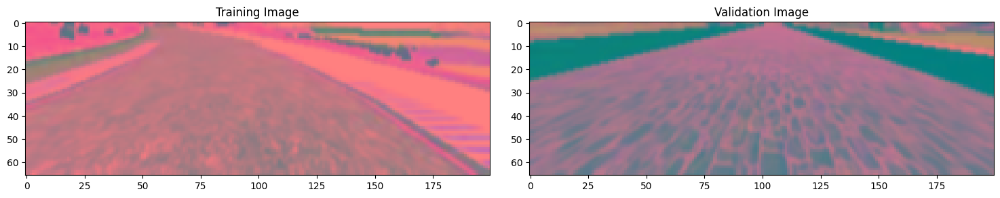

In [ ]:
fig, axs = plt.subplots (1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')
axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

# IMPLEMENTING NVIDIA MODEL

This code defines and builds a deep learning model inspired by NVIDIA's end-to-end self-driving car architecture. The goal of this model is to predict the steering angle of a vehicle based on a camera image from the front of the car.



In [ ]:
def nvidia_model():
  model= Sequential()
  model.add(Conv2D(24, (5, 5), strides= (2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Conv2D(36, (5, 5), strides =(2, 2), activation='elu'))
  model.add(Conv2D(48, (5, 5), strides= (2, 2), activation='elu'))
  model.add(Conv2D(64, (5, 5), activation='elu'))
  #model.add(Conv2D(64, (3,3), activation='elu'))
  #model.add(Dropout(0.5))
  model.add(Flatten())
  model.add(Dense(100, activation ='elu'))
  #model.add(Dropout(0.5))
  model.add(Dense (50, activation = 'elu'))
  #model.add(Dropout(0.5))
  model.add(Dense(10, activation = 'elu'))
  # model.add(Dropout(0.5))
  model.add(Dense(1))
  optimizer= tf.keras.optimizers.Adam(learning_rate=1e-3)
  model.compile(loss='mse', optimizer=optimizer)
  return model
model=nvidia_model()
print(model.summary())


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 31, 98, 24)     │         1,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 14, 47, 36)     │        21,636 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 5, 22, 48)      │        43,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 1, 18, 64)      │        76,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1152)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 100)            │       115,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           510 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 264,443 (1.01 MB)

 Trainable params: 264,443 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

None


# **SPRINT 4**

# Start Model Training

In [ ]:
history = model.fit(
    batch_generator(X_train, y_train, 100, 1),
    steps_per_epoch=300,
    epochs=10,
    validation_data=batch_generator(X_valid, y_valid, 100, 0),
    validation_steps=200,
    verbose=1,
    shuffle=1)


Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 129s 418ms/step - loss: 0.2222 - val_loss: 0.1037
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 123s 411ms/step - loss: 0.1067 - val_loss: 0.0687
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 144s 480ms/step - loss: 8.2723 - val_loss: 5.3192
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 123s 412ms/step - loss: 4.7607 - val_loss: 3.5100
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 142s 476ms/step - loss: 2.8425 - val_loss: 1.9337
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 142s 475ms/step - loss: 1.5734 - val_loss: 1.0233
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 142s 474ms/step - loss: 0.7727 - val_loss: 0.5914
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 120s 403ms/step - loss: 0.4544 - val_loss: 0.2980
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 123s 411ms/step - loss: 0.2001 - val_loss: 0.1750
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 141s 472ms/step - loss: 0.1636 - val_loss: 0.1403


Text(0.5, 0, 'Epoch')

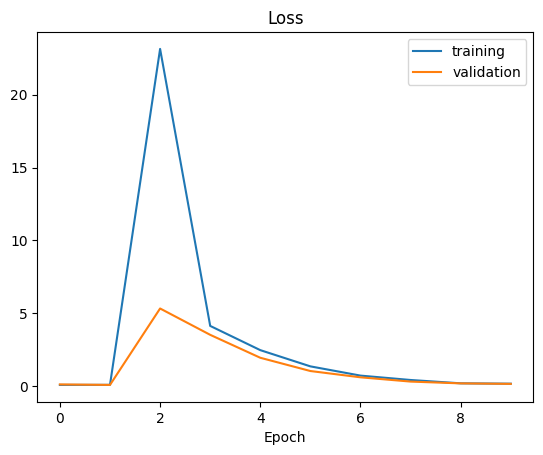

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel("Epoch")

In [ ]:
model.save('model.h5')
from google.colab import files
files.download('model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>